# **ARIMA-GARCH model for long-term forecasting**

### Importing libraries

In [270]:
# Importing Libraries
import numpy as np
import pandas as pd
import pandas_datareader as pdr
from  datetime import datetime as dt
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objs as go

import statsmodels.api as sms
from statsmodels.tsa.stattools import adfuller
from statsmodels.stats.diagnostic import het_arch
from statsmodels.stats.diagnostic import het_breuschpagan
from statsmodels.stats.stattools import durbin_watson

from statsmodels.tsa.arima.model import ARIMA
from arch import arch_model
from arch.univariate import ARCH, GARCH
from arch.univariate import Normal

from statsmodels.graphics.tsaplots import plot_pacf
from statsmodels.graphics.tsaplots import plot_acf

#Ignore warnings
import warnings
warnings.filterwarnings("ignore")

### Defining the used functions

In [5]:
# Defining the used function
def stationarity_test(data): # Testing for Stationarity
    for i in ["nc","c","ct","ctt"]:
        adf_result = adfuller(data['Adj Close'], regression=i, autolag = "AIC")
        print('The p-value with reg_parm {} for the stationarity test is : {}'.format(i, round(adf_result[1], 2)))

In [6]:
def arima_tuning(data, reg_parm, trend, max_p, max_q): # Finding the best ARIMA parameters
    adf_result = adfuller(data, regression=reg_parm, autolag = "AIC")
    if (adf_result[1] <= 0.05):
        d = 0
    else:
        diff = data.diff(periods=1).dropna()
        adf_result = adfuller(diff, regression=reg_parm, autolag = "AIC")
        if (adf_result[1] <= 0.05):
            d = 1
        else:
            diff = diff.diff(periods=1).dropna()
            adf_result = adfuller(diff, regression=reg_parm, autolag = "AIC")
            if (round(adf_result[1], 4) <= 0.05):
                d = 2
    AIC = {}
    for p in range(max_p):
        for q in range(max_q):
            model = ARIMA(data, trend=trend, order=(p,d,q)).fit()
            n=0
            for i in model.pvalues:
                if (i <= 0.05):
                    n = n + 1
            if trend == 'n':
                if( n == p+q + 1):
                    AIC[(p,d,q)] = model.aic
            if trend == 't':
                if( n == p+q + 2):
                    AIC[(p,d,q)] = model.aic
    for order, aic in AIC.items():
        if aic == min(AIC.values()):
            p,d,q = order
    return p,d,q

In [273]:
def garch_tuning(data, max_p, max_q):
    AIC = {}
    for p in range(1, max_p):
        for q in range(max_q):
            model = arch_model(data, mean='AR', p=p, q=q).fit(disp="off", show_warning=False)
            n=0
            for i in model.pvalues:
                if (i <= 0.05):
                    n = n +1
            if( n == p+q + 2):
                AIC[(p,q)] = model.aic
    for order, aic in AIC.items():
        if aic == min(AIC.values()):
            p,q = order
    return p,q

In [8]:
def ARCH_test(data, p, q):
    from statsmodels.stats.diagnostic import het_arch
    test  = het_arch(data, ddof=p+q)
    if (test[-1] <= 0.05):
        x = True
    else:
        x = False
    return x

## Get sample data

In [70]:
data = pdr.get_data_yahoo('^GSPC', dt(1971, 1, 1), dt(2020, 1, 1))
df = data[['Adj Close']].copy()

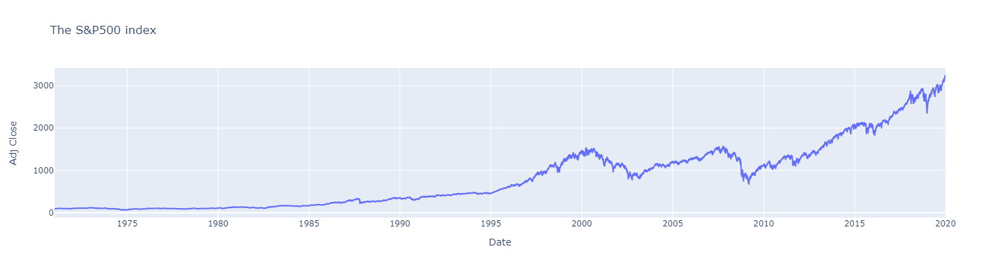

In [71]:
fig = px.line(df, y="Adj Close", title = 'The S&P500 index', width=1400, height=400)
fig.show()

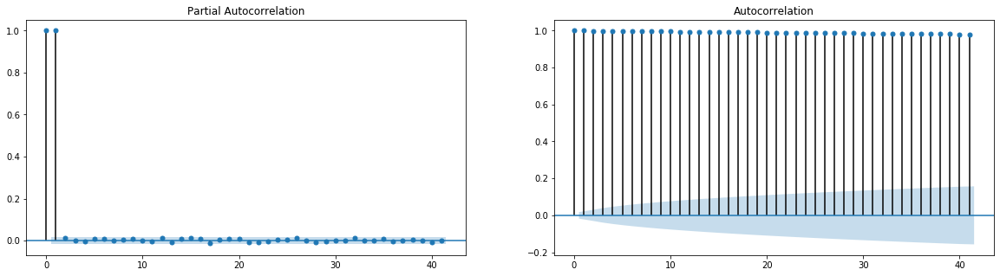

In [72]:
# PACF and ACF --> Checking for Stationarity and Weak-dependence conditions
fig, (ax1, ax2) = plt.subplots(1,2, figsize=(20,5))
pacf_plot = plot_pacf(df['Adj Close'], ax=ax1)
acf_plot = plot_acf(df['Adj Close'], ax=ax2)

In [73]:
stationarity_test(df)

The p-value with reg_parm nc for the stationarity test is : 1.0
The p-value with reg_parm c for the stationarity test is : 1.0
The p-value with reg_parm ct for the stationarity test is : 1.0
The p-value with reg_parm ctt for the stationarity test is : 0.97


## Splitting the Data in Training and Testing Sets

In [200]:
# print(df.shape) --> (12359, 1)
df_test = df.iloc[int(len(df)*(1 - 0.10)):].copy()
df_train = df.iloc[:int(len(df)*(1 - 0.10))].copy()
# print(df_train.shape,df_test.shape) --> (9887, 1) (2472, 1)

## Selecting the best ARIMA model

In [201]:
# Defining the best ARIMA model using the arima_tuning function
print('The Best Arima Model for our df_train data is : ARIMA({})'.format(arima_tuning(df_train, reg_parm='ct', trend='t', max_p=2, max_q=2)))

The Best Arima Model for our df_train data is : ARIMA((1, 1, 1))


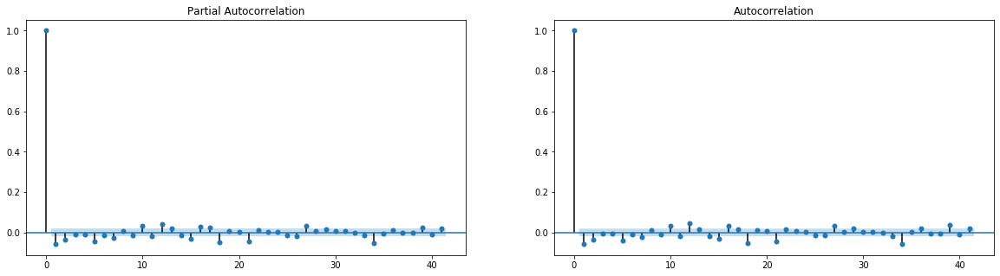

In [202]:
# PACF and ACF --> Checking for Stationarity and Weak-dependence conditions after first differencing
fig, (ax1, ax2) = plt.subplots(1,2, figsize=(20,5))
pacf_plot = plot_pacf(df_train['Adj Close'].diff(periods=1).dropna(), ax=ax1)
acf_plot = plot_acf(df_train['Adj Close'].diff(periods=1).dropna(), ax=ax2)

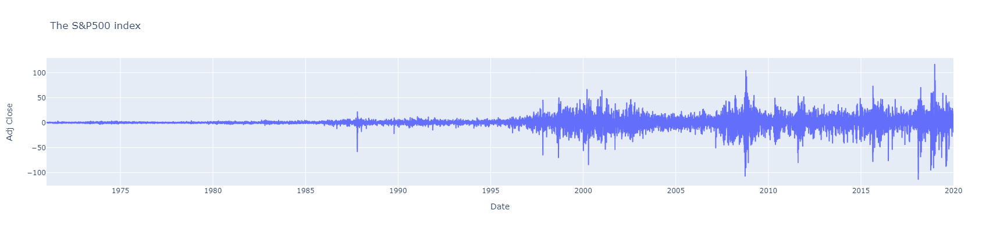

In [203]:
# Plotting the differenced data
fig = px.line(df.diff(periods=1).dropna(), y="Adj Close", title = 'The S&P500 index', width=1400, height=400)
fig.show()

## Fitting the best ARIMA model and checking the residuals

In [204]:
arima_model = ARIMA(df_train, trend='t', order=(3,1,4)).fit()
print(arima_model.summary())

                               SARIMAX Results                                
Dep. Variable:              Adj Close   No. Observations:                11123
Model:                 ARIMA(3, 1, 4)   Log Likelihood              -40696.914
Date:                Sun, 28 Nov 2021   AIC                          81411.828
Time:                        16:04:26   BIC                          81477.678
Sample:                             0   HQIC                         81434.001
                              - 11123                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
x1             0.1889      0.081      2.342      0.019       0.031       0.347
ar.L1         -0.7313      0.065    -11.306      0.000      -0.858      -0.605
ar.L2          0.7469      0.047     15.899      0.0

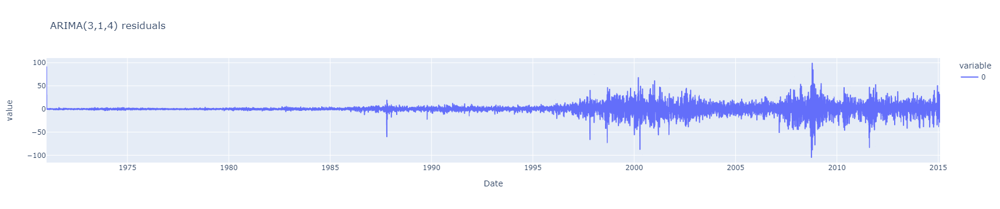

In [205]:
fig = px.line(arima_model.resid, title = 'ARIMA(3,1,4) residuals')
fig.show()

In [206]:
# Autoregression conditional Heteroskedasity (ARCH) test
x = ARCH_test(arima_model.resid, p=4, q=2)
print('Presence of ARCH effect is : {}'.format(x))

Presence of ARCH effect is : True


## Selecting the best GARCH model

In [274]:
# Defining the best ARIMA model using the arima_tuning function
print('The Best GARCH Model for our df_train data is : GARCH({})'.format(garch_tuning(arima_model.resid, max_p=5, max_q=5)))

The Best GARCH Model for our df_train data is : GARCH((1, 1))


## Fitting the best GARCH model and checking the residuals

In [253]:
gam = arch_model(arima_model.resid, mean='Zero', p=1, q=1)
garch_model = gam.fit(disp="off")
garch_model

                       Zero Mean - GARCH Model Results                        
Dep. Variable:                   None   R-squared:                       0.000
Mean Model:                 Zero Mean   Adj. R-squared:                  0.000
Vol Model:                      GARCH   Log-Likelihood:               -30556.5
Distribution:                  Normal   AIC:                           61119.1
Method:            Maximum Likelihood   BIC:                           61141.0
                                        No. Observations:                11123
Date:                Sun, Nov 28 2021   Df Residuals:                    11123
Time:                        21:53:24   Df Model:                            0
                              Volatility Model                              
                 coef    std err          t      P>|t|      95.0% Conf. Int.
----------------------------------------------------------------------------
omega      7.9956e-03  2.414e-03      3.311  9.280e-04 [3.

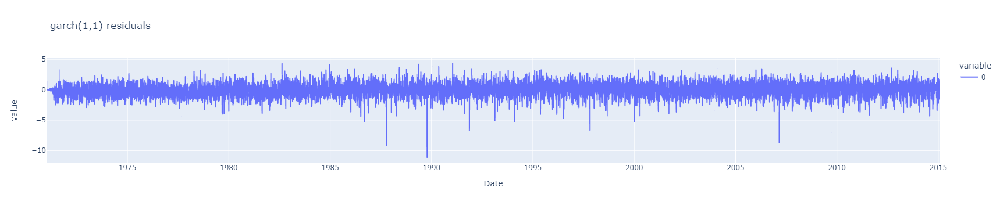

In [254]:
standarized_resid = garch_model.resid/garch_model.conditional_volatility
fig = px.line(standarized_resid, title = 'garch(1,1) residuals')
fig.show()

In [255]:
# Autoregression conditional Heteroskedasity (ARCH) test in the GARCH(1,1) standarized residuals
x = ARCH_test(standarized_resid, p=4, q=3)
print('Presence of ARCH effect in the GARCH(1,1) residuals is : {}'.format(x))

Presence of ARCH effect in the GARCH(1,1) residuals is : False


## Plotting the ARIMA mean_forecast

In [256]:
arima_forecast = arima_model.get_forecast(steps=len(df_test))

In [257]:
mean_forecast = pd.DataFrame(arima_forecast.predicted_mean.values, index=df_test.index, columns=['mean_forecast'])
lower_bound = pd.DataFrame(arima_forecast.conf_int(alpha=0.05)['lower Adj Close'].values, index=df_test.index, columns=['lower_bound'])
upper_bound =pd.DataFrame(arima_forecast.conf_int(alpha=0.05)['upper Adj Close'].values, index=df_test.index, columns=['upper_bound'])

In [269]:
Mean = pd.concat([df_train.rename(columns={'Adj Close' : 'train'}), mean_forecast, df_test.rename(columns={'Adj Close' : 'test'}), lower_bound, upper_bound], join='outer')[360*11:]

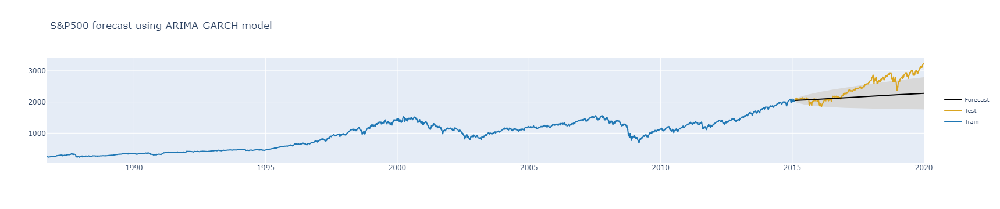

In [277]:
fig = go.Figure([
    go.Scatter(
        name='Lower_bound',
        x=Mean.index,
        y=Mean['lower_bound'],
        mode='lines',
        line=dict(width=0),
        showlegend=False
    ),
    go.Scatter(
        name='Upper_bound',
        x=Mean.index,
        y=Mean['upper_bound'],
        marker=dict(color="#444"),
        line=dict(width=0),
        mode='lines',
        fillcolor='rgb(216, 216, 216)',
        fill='tonexty',
        showlegend=False
    ),
    go.Scatter(
        name='Train',
        x=Mean.index,
        y=Mean['train'],
        mode='lines',
        line=dict(color='rgb(31, 119, 180)'),
    ),
    go.Scatter(
        name='Test',
        x=Mean.index,
        y=Mean['test'],
        mode='lines',
        line=dict(color='goldenrod'),
    ),
    go.Scatter(
        name='Forecast',
        x=Mean.index,
        y=Mean['mean_forecast'],
        line=dict(color='black'),
        mode='lines'
    )
])
fig.update_layout(legend=dict(y=0.5, font_size=10), title = 'S&P500 forecast using ARIMA-GARCH model')
fig.write_html("E:/Directory/Neoma Courses/Data viz Directory/pp.html")
fig.show()